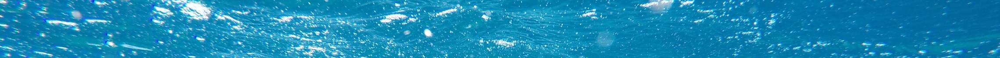
# Intel® oneAPI Hackathon for Open Innovation
## Machine Learning Challenge Track: Predict the quality of freshwater
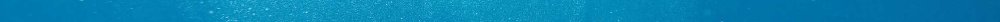

## Table of Contents <a id = 'top'/>
* [Utilities](#ufunc)
* [Data Load](#load)
* [Data Preprocessing](#preprocessing)
    * Missing Value Treatment
* [Exploratory Data Analysis](#eda)
    * [Data Visualization](#data_viz)
    * [Correlation (check only: not ideal for a binary target)](#corr)
    * [K-Means Clustering](#kmeans)
    * [PCA](#PCA)
* [Divide & Conquer: Clustering](#clustering)

[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
## Utilities <a id='ufunc'/>

In [1]:
from constants import *

# DATA PROCESSING
import numpy as np
import pandas as pd
import daal4py as d4p
import joblib
pd.set_option('display.max_columns', None)

# DATA VISUALIZATION
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

# MACHINE LEARNING
#from sklearnex import patch_sklearn
#patch_sklearn()
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA

# MISCELLANEOUS
import time
import gc
import warnings
warnings.filterwarnings('ignore')

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(np.arange(data.shape[1]), labels=col_labels)
    ax.set_yticks(np.arange(data.shape[0]), labels=row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-45, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=("black", "white"),
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A pair of colors.  The first is used for values below a threshold,
        the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

def load_kmeans(nClusters = 2):
    n = str(nClusters)
    
    centroids_filename = './models/centroids/kmeans_clustering_'+ n +'_clusters_initcentroids_1.csv'
    centroids = joblib.load(open(centroids_filename, "rb"))
    
    assignments = np.array([])
    for i in range(1,5):
        assignments_filename = './models/assignments/kmeans_clustering_'+ n +f'_clusters_assignments_{i}.csv'
        a = joblib.load(open(assignments_filename, "rb"))
        a = a.flatten()
        assignments = np.hstack([assignments, a])
        
    return centroids, assignments

[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
## Data Load <a id='load'/>

In [3]:
%time
try:
    df = pd.read_csv(PATH, dtype = DTYPES)
except:
    download = input(prompt = 'Dataset could not be loaded from local storage. Download from AWS? (y/n)')
    if download == 'y':
        df = pd.read_csv(URL, compression='zip')
        df.to_csv(PATH)
    else:
        print('Please save the dataset under Water_Quality/dataset.csv')

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 6.44 µs


Dataset could not be loaded from local storage. Download from AWS? (y/n) n


Please save the dataset under Water_Quality/dataset.csv


In [5]:
df.head(2)

,Index,pH,Iron,Nitrate,Chloride,Lead,Zinc,Color,Turbidity,Fluoride,Copper,Odor,Sulfate,Conductivity,Chlorine,Manganese,Total Dissolved Solids,Source,Water Temperature,Air Temperature,Month,Day,Time of Day,Target
0,0,8.332989,0.000083,8.605777,122.799774,3.713298e-52,3.434827,Colorless,0.022683,0.607283,0.144599,1.626212,87.266538,471.683357,3.708178,2.269945e-15,332.118789,NaN,NaN,43.493324,January,29.0,4.0,0.0
1,1,6.917863,0.000081,3.734167,227.029846,7.849262e-94,1.245317,Faint Yellow,0.019007,0.622874,0.437835,1.686049,144.010981,432.844908,3.292038,8.024076e-07,284.641984,Lake,15.348981,71.220586,November,26.0,16.0,0.0


[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
## Data Preprocessing <a id ='preprocessing'/>

In [6]:
df.set_index('Index', inplace = True)

### Missing Value Treatment

In [7]:
pd.DataFrame(df.isna().sum()/df.shape[0]*100, columns = ['Percentage (%) of missing values'])

,Percentage (%) of missing values
pH,1.941373
Iron,0.665791
Nitrate,1.772604
Chloride,2.946353
Lead,0.450050
Zinc,2.632778
Color,0.095999
Turbidity,0.839257
Fluoride,3.179378
Copper,3.343523


1-3% of values are missing in all of the columns. <br>
Missing Target label records can be dropped. <br>
Although it is possible to simply drop the columns, lets mean-fill the numericals and mode fill the integer categories.

In [8]:
df = df[df['Target'].isna() == False]

In [9]:
backup = df.copy()

In [10]:
df.fillna(dict(**df.drop(columns = 'Target').select_dtypes(exclude=['object']).median().to_dict(),
                 **df.select_dtypes(include=['object']).mode().iloc[0].to_dict()), 
            inplace = True) 

assert df.isna().sum().max() == 0, "Null values treatment failed"

Encode the months

In [11]:
df['Month'] = df['Month'].apply(lambda m: MONTHS[m])

In [12]:
print(f'Cleared {gc.collect()} unreachable objects.')

Cleared 0 unreachable objects.


[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
## Exploratory Data Analysis <a id= 'eda'/>

### Data Visualization <a id = 'data_viz'/>

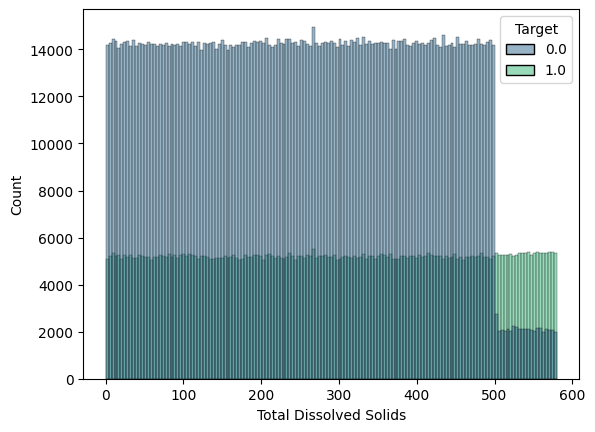

In [13]:
sns.histplot(df, x='Total Dissolved Solids', hue = 'Target', palette = 'viridis');

The distribution of target 1 tests and target 0 tests are more or less uniform. <br> Beyond a TDS of ~500, the number of tests resulting in 0 is significantly lower. <br>
<strong>Target 0 most likely indicates drinkable water. </strong>

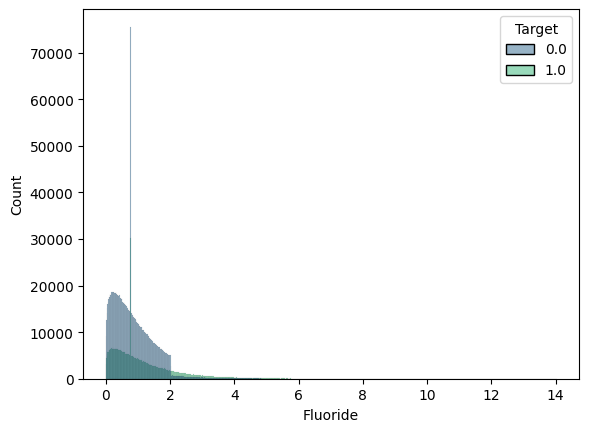

In [14]:
sns.histplot(df, x='Fluoride', hue = 'Target', palette = 'viridis');

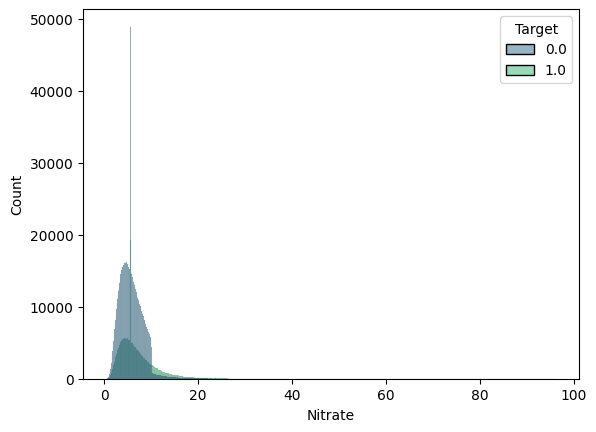

In [15]:
sns.histplot(df, x='Nitrate', hue = 'Target', palette = 'viridis');

Null value imputation by median & mode has caused an unnecessary spike in the distribution. Better treatment is necessary.

> Data PreProcessing - II Undo null value treatment (START)

In [16]:
df = backup.copy()
del backup

In [17]:
data_loss = np.round(100 - df.dropna().shape[0]*100/df.shape[0], decimals = 2)
print(f'Dropping records will null values will delete {data_loss}% of the training data')

Dropping records will null values will delete 33.17% of the training data


> Better to go for KNN Imputation

In [18]:
#imputer = KNNImputer(n_neighbors=1, weights="uniform")
#numeric_columns = list(df.select_dtypes(exclude = ['object']).columns)
#df[numeric_columns] = imputer.fit_transform(df[numeric_columns])
## save the file
#df.to_csv('imputedKNN.csv', index=False)

> Too Slow. Kernel disconects.<br>
> Try forward fill after sorting - Approximation of KNN Imputation with n_neighbors=1<br>

In [19]:
numeric_columns = list(df.select_dtypes(exclude = ['object']).columns)
df.sort_values(by = numeric_columns, inplace = True)

> **Before Imputation**

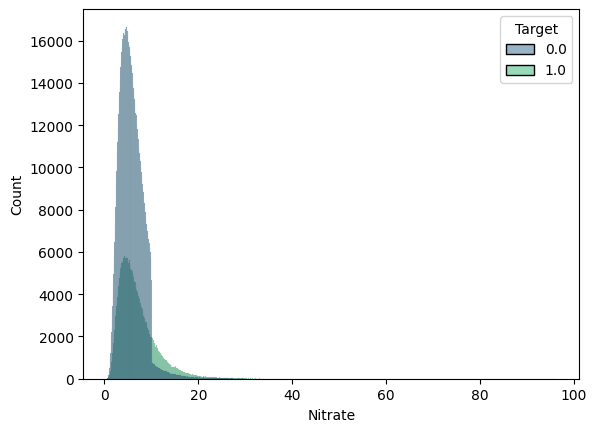

In [20]:
sns.histplot(df, x='Nitrate', hue = 'Target', palette = 'viridis');

In [21]:
df[numeric_columns] = df[numeric_columns].replace((np.nan, ''), (None, None)).ffill(axis = 0, limit = None).bfill(axis = 0, limit = None)

> **After Imputation**

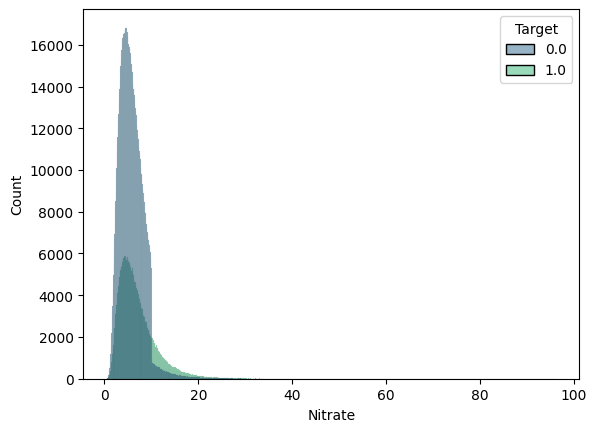

In [22]:
sns.histplot(df, x='Nitrate', hue = 'Target', palette = 'viridis');

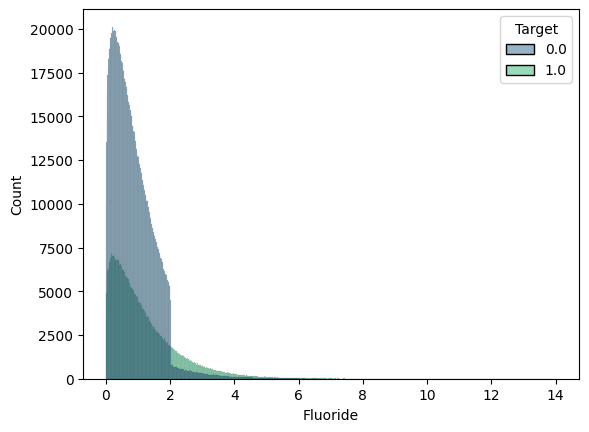

In [23]:
sns.histplot(df, x='Fluoride', hue = 'Target', palette = 'viridis');

In [24]:
object_columns = list(df.select_dtypes(include = ['object']).columns)
df[object_columns] = df[object_columns].replace((np.nan, ''), (None, None)).ffill(axis = 0).bfill(axis = 0, limit = None)

In [25]:
df['Month'] = df['Month'].apply(lambda m: MONTHS[m])

In [26]:
assert df.isna().sum().max() == 0, "Null values treatment failed"

> Data PreProcessing - II Undo null value treatment (END)

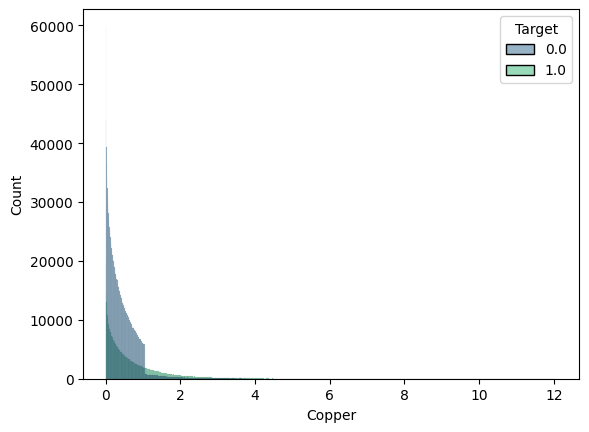

In [27]:
sns.histplot(df, x='Copper', hue = 'Target', palette = 'viridis');

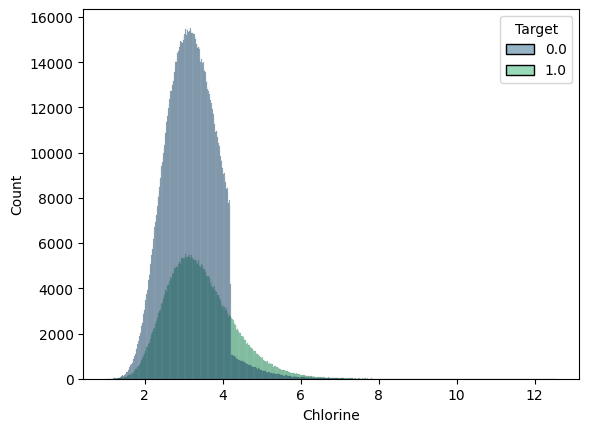

In [28]:
sns.histplot(df, x='Chlorine', hue = 'Target', palette = 'viridis');

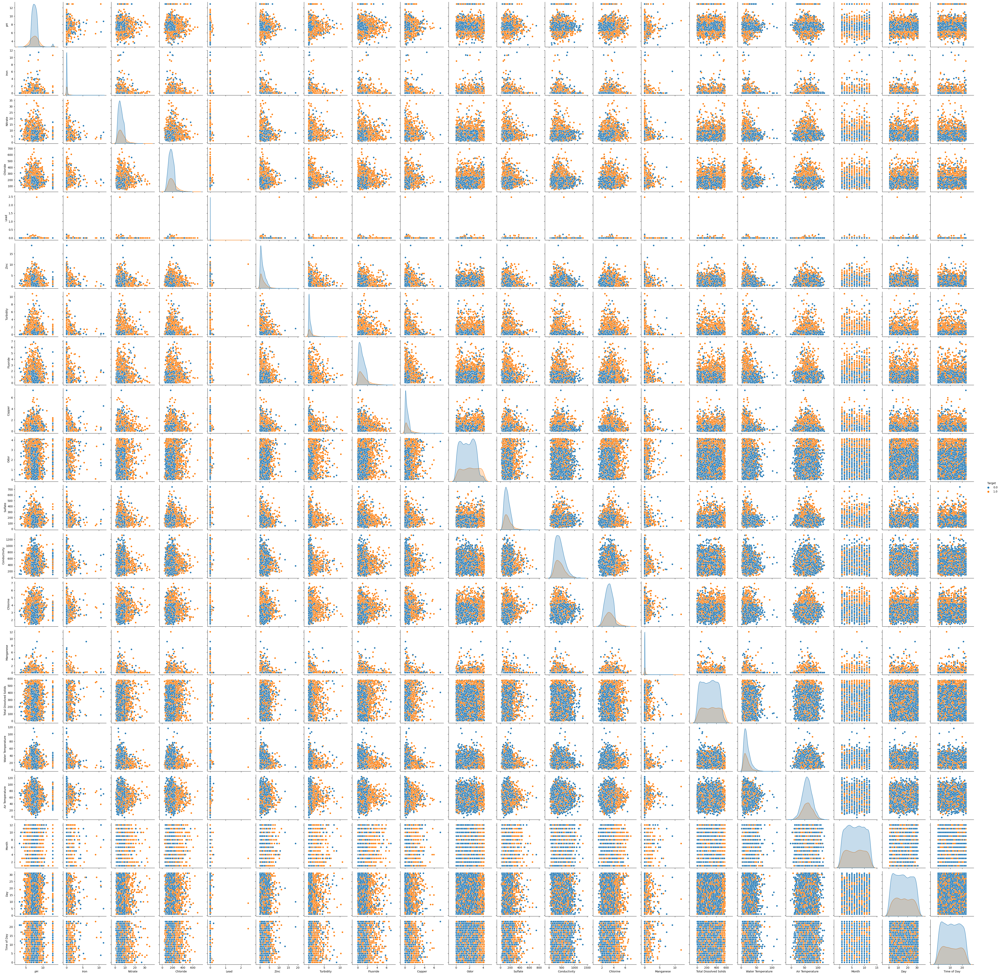

In [31]:
fig = sns.pairplot(df.sample(5000), hue = 'Target')
#fig.fig.savefig('pairplot.png')

![pairplot.png](https://github.com/Chahbaz-Aman/Intel-oneAPI-Water-Quality-Testing/blob/main/assets/pairplot.png?raw=true)

In [30]:
print(f'Cleared {gc.collect()} unreachable objects.')

Cleared 178441 unreachable objects.


[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
### Correlation (check only: not ideal for a binary target) <a id = 'corr'/>

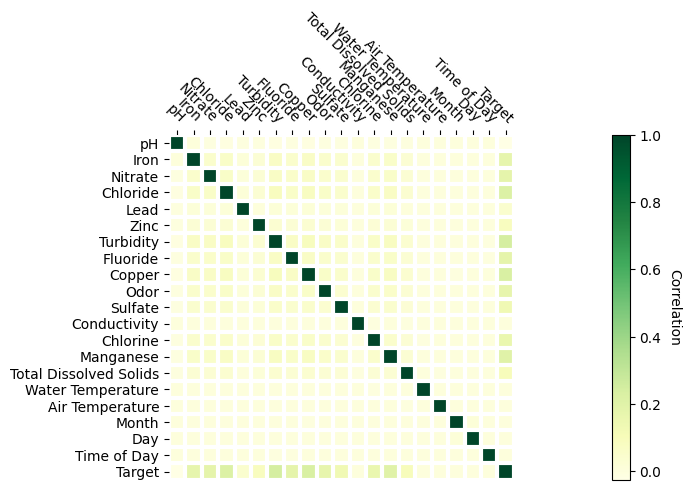

In [35]:
fig, ax = plt.subplots(figsize = (20,5))

temp = df.corr()
im, cbar = heatmap(temp, list(temp.columns), list(temp.columns), ax=ax,
                   cmap="YlGn", cbarlabel="Correlation")
#texts = annotate_heatmap(im, valfmt="{x:.1f} t")
del temp

fig.tight_layout()

In [36]:
pd.get_dummies(df).corr()[['Target']].T

,pH,Iron,Nitrate,Chloride,Lead,Zinc,Turbidity,Fluoride,Copper,Odor,Sulfate,Conductivity,Chlorine,Manganese,Total Dissolved Solids,Water Temperature,Air Temperature,Month,Day,Time of Day,Target,Color_Colorless,Color_Faint Yellow,Color_Light Yellow,Color_Near Colorless,Color_Yellow,Source_Aquifer,Source_Ground,Source_Lake,Source_Reservoir,Source_River,Source_Spring,Source_Stream,Source_Well
Target,-0.024928,0.175175,0.17984,0.217691,0.043031,0.08605,0.243213,0.179607,0.228701,0.170458,0.135079,-0.000016,0.156571,0.199903,0.098837,-0.000183,0.00004,-0.000288,0.000364,-0.000816,1.0,-0.148121,0.033781,0.148311,-0.148503,0.259671,-0.00064,-0.000722,0.001403,0.000124,0.001177,-0.001579,-0.00053,0.000767


While the the features are independent of each other, their correlation with the target is also quite poor. <br>
Maybe clustering them based on similarities will result in better seggregation.<br>
> Consider consine similarity as metric since the dimensions seem to be orthogonal.

In [58]:
print(f'Cleared {gc.collect()} unreachable objects.')

Cleared 0 unreachable objects.


[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
### K-Means Clustering <a id='kmeans'/>

Split and save file into 4 for distributed k-means

In [19]:
#%time
#for i,df in enumerate(pd.read_csv(PATH, chunksize=681260, dtype=DTYPES)):
#    df = df[df['Target'].isna() == False]
#    df.fillna(dict(**df.drop(columns = 'Target').select_dtypes(exclude=['object']).median().to_dict(),
#                   **df.select_dtypes(include=['object']).mode().iloc[0].to_dict()), 
#              inplace = True)

#    assert df.isna().sum().max() == 0, "Null values treatment failed"
#    df['Month'] = df['Month'].apply(lambda m: MONTHS[m])
#    df = pd.get_dummies(df, sparse = True)
#    df.drop(columns = ['Target'], inplace = True)
#    df.to_csv('data/chunk{}.csv'.format(i), index=False)

In [18]:
#!mpirun -n 4 python ./distributedKMeans.py "7"

In [38]:
_, clusters = load_kmeans(4)

In [49]:
df['cluster'] = clusters
df['cluster'] = df['cluster'].astype('int8')

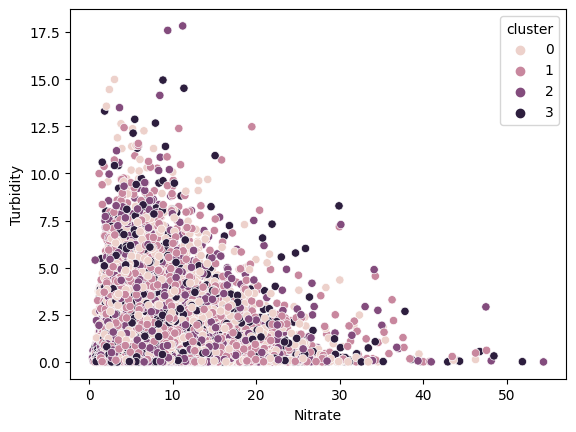

In [50]:
sns.scatterplot(df.sample(100000), x = 'Nitrate', y = 'Turbidity', hue = 'cluster');

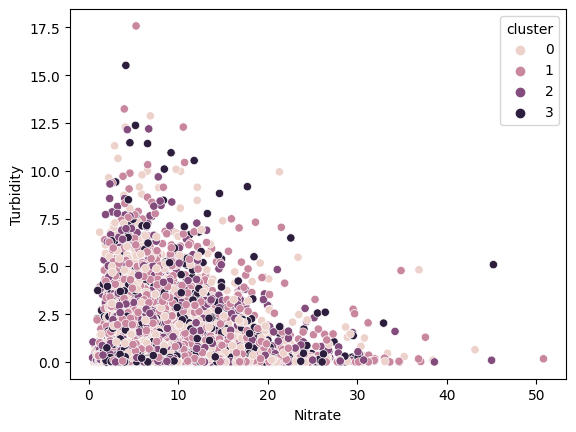

In [51]:
sns.scatterplot(df[df.Target == 0].sample(100000), x = 'Nitrate', y = 'Turbidity', hue = 'cluster');

Looking at the state of the cluster plots and the histograms in the [Data Visualization](#dataviz) section, the dataset appears to be following a single standard for quality reporting.

In [60]:
df.drop(columns = ['cluster'], inplace = True)
del clusters

In [57]:
print(f'Cleared {gc.collect()} unreachable objects.')

Cleared 103169 unreachable objects.


[<div style = 'text-align:right'><button>Back to top</button></div>](#top)
### PCA <a id = 'pca'/>

In [61]:
norm = MinMaxScaler()

In [62]:
pca = PCA(n_components = 3)

In [72]:
df.columns

Index(['pH', 'Iron', 'Nitrate', 'Chloride', 'Lead', 'Zinc', 'Color',
       'Turbidity', 'Fluoride', 'Copper', 'Odor', 'Sulfate', 'Conductivity',
       'Chlorine', 'Manganese', 'Total Dissolved Solids', 'Source',
       'Water Temperature', 'Air Temperature', 'Month', 'Day', 'Time of Day',
       'Target'],
      dtype='object')

In [73]:
temp = pca.fit_transform( norm.fit_transform(df.drop(columns = ['Target','Month', 'Day', 'Time of Day', 'Source']).select_dtypes(exclude=['object'])) )

In [74]:
temp = pd.DataFrame(temp)

In [75]:
temp['Target'] = df['Target']

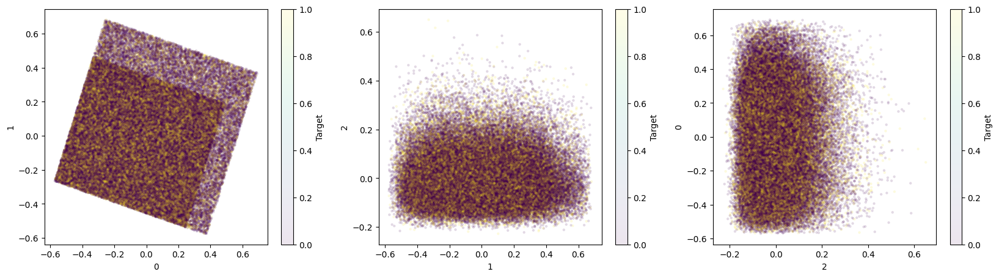

In [76]:
fig, ax = plt.subplots(1,3, figsize = (20,5))

temp = temp.sample(100000)
temp.plot.scatter(x=0,
                y=1,
                c='Target',
                alpha = 0.1,
                marker = '.',
                ax = ax[0],
               );

temp.plot.scatter(x=1,
                y=2,
                c='Target',
                alpha = 0.1,
                marker = '.',
                ax = ax[1],
               );

temp.plot.scatter(x=2,
                y=0,
                c='Target',
                alpha = 0.1,
                marker = '.',
                ax = ax[2],
               );

In [77]:
del temp

In [78]:
print(f'Cleared {gc.collect()} unreachable objects.')

Cleared 17378 unreachable objects.


* Getting rid of the overlap among clusters is impossible even with PCA
* Try running KMeans on only safe drinking water
* Normalization is the ideal choice when we know that the distribution of data does not follow a Gaussian distribution or for algorithms that do not assume any data distribution like K-Nearest Neighbors and Neural Networks
* Normalize measurements -> Check correlation before and after
* Check correlation between time of day & temperature -> If it is possible to cluster them then they might do a decent job
* Try Neural Network for this job. There is plenty of data -> Manual feature engineering may not be required